# Package Preparation

To save an animation as a GIF file, install imagemagick.

## 1. Install Homebrew in a terminal

The Homebrew installation process will prompt you to press Enter to continue and enter your Mac user password (note: no characters will be displayed when entering the password). Just follow the prompts.

## 2. Configure the Homebrew path

After the installation is complete, if you are still unable to use the brew command, make sure that the path to Homebrew is properly added to your terminal configuration file. You can run the following command to add the path to Homebrew to your .zshrc file:

## 3. Verify that Homebrew was installed successfully

Restart the terminal and enter the following command to check if Homebrew was installed successfully:

## 4. Continue installing ImageMagick

After a successful installation, you can use Homebrew to install ImageMagick:

# fundamental code

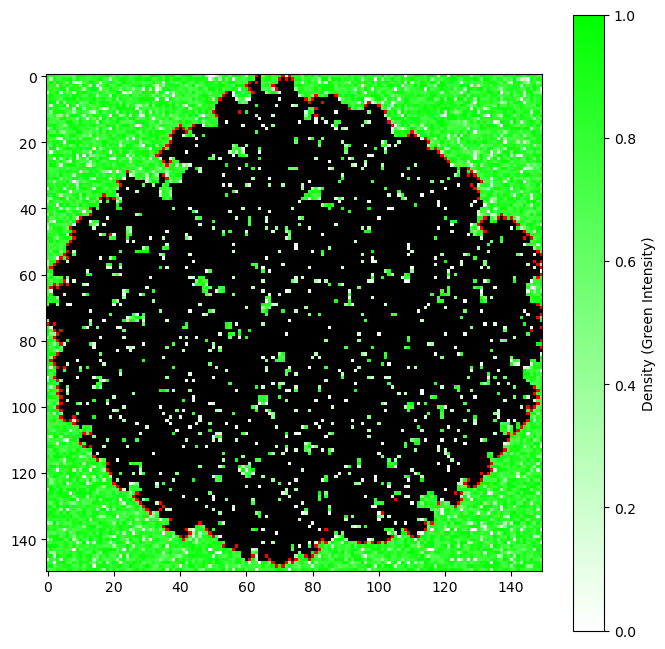

In [72]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.animation as animation

# 设置网格大小
grid_size = 150
forest = np.zeros((grid_size, grid_size), dtype=int)

# 创建一个80%的密度在0.7以上的密度矩阵
def generate_density(grid_size, threshold=0.7, percentage=0.8):
    density = np.random.rand(grid_size, grid_size)
    num_high_density = int(grid_size * grid_size * percentage)
    indices = np.indices((grid_size, grid_size)).reshape(2, -1).T
    high_density_indices = np.random.choice(len(indices), num_high_density, replace=False)
    
    for idx in high_density_indices:
        x, y = indices[idx]
        density[x, y] = np.random.uniform(threshold, 1.0)
    
    return density

density = generate_density(grid_size)

# 初始化火源位置
start_fire_x, start_fire_y = grid_size // 2, grid_size // 2 #更符合现实情况，设置起火点在center
forest[start_fire_x, start_fire_y] = 1

# 传播概率函数，仅基于密度
def calculate_spread_probability(density):
    base_probability = 0.8
    spread_probability = base_probability * density
    return min(spread_probability, 1.0)

# 模拟火灾传播
def update_forest(forest, density):
    new_forest = forest.copy()
    for i in range(grid_size):
        for j in range(grid_size):
            if forest[i, j] == 1:
                neighbors = [(i-1, j), (i+1, j), (i, j-1), (i, j+1)]
                for neighbor_x, neighbor_y in neighbors:
                    if 0 <= neighbor_x < grid_size and 0 <= neighbor_y < grid_size:
                        if forest[neighbor_x, neighbor_y] == 0:
                            spread_probability = calculate_spread_probability(density[neighbor_x, neighbor_y])
                            #作用：生成一个随机数 np.random.rand()（0 到 1 之间的浮点数），如果这个随机数小于传播概率，则将邻居单元的状态设置为 1（燃烧）。
                            if np.random.rand() < spread_probability: #
                                new_forest[neighbor_x, neighbor_y] = 1
                new_forest[i, j] = 2
    return new_forest

# 创建基于密度的颜色矩阵
def create_color_array(forest, density):
    color_array = np.zeros((grid_size, grid_size, 3))
    for i in range(grid_size):
        for j in range(grid_size):
            if forest[i, j] == 0:  # 未燃
                green_intensity = density[i, j]
                color_array[i, j] = [1 - green_intensity, 1, 1 - green_intensity]
            elif forest[i, j] == 1:  # 燃烧中
                color_array[i, j] = [1, 0, 0]  # 红色
            elif forest[i, j] == 2:  # 燃尽
                color_array[i, j] = [0, 0, 0]  # 黑色
    return color_array

# 创建图像和动画
fig, ax = plt.subplots(figsize=(8, 8))
color_array = create_color_array(forest, density)
im = ax.imshow(color_array, interpolation='nearest')

# 创建一个自定义的颜色映射（colormap）用于颜色条
cmap = mcolors.LinearSegmentedColormap.from_list("density_colormap", [(1, 1, 1), (0, 1, 0)], N=256)

# 设置颜色条的颜色范围和标签
norm = mcolors.Normalize(vmin=0, vmax=1)
cbar = plt.colorbar(plt.cm.ScalarMappable(cmap=cmap, norm=norm), ax=ax)
cbar.set_label('Density (Green Intensity)')

def animate(step):
    global forest
    forest = update_forest(forest, density)
    color_array = create_color_array(forest, density)
    im.set_array(color_array)
    
    if step in [25, 50, 75, 100]:
        plt.savefig(f"forest_fire_step_{step}.png")
        
    return [im]

# 创建动画
ani = animation.FuncAnimation(fig, animate, frames=100, interval=200, blit=True)

# 展示动画
from IPython.display import HTML
HTML(ani.to_jshtml())
